## CLUSTERING ANALYSIS 

In [1]:
#load the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (25,15)
plt.rcParams['figure.dpi'] = 600 
%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("EastWestAirlines.csv")

In [3]:
data

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
data.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [5]:
data.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


## Data Preprocessing:

In [6]:
data.dtypes

ID#                  int64
Balance              int64
Qual_miles           int64
cc1_miles            int64
cc2_miles            int64
cc3_miles            int64
Bonus_miles          int64
Bonus_trans          int64
Flight_miles_12mo    int64
Flight_trans_12      int64
Days_since_enroll    int64
Award?               int64
dtype: object

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [8]:
data.cc1_miles.unique()

array([1, 4, 3, 2, 5], dtype=int64)

In [9]:
data.cc2_miles.unique()

array([1, 2, 3], dtype=int64)

In [10]:
data.cc3_miles.unique()

array([1, 3, 2, 4, 5], dtype=int64)

In [11]:
data.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
3994    False
3995    False
3996    False
3997    False
3998    False
Length: 3999, dtype: bool

In [12]:
data.duplicated().sum()

0

In [13]:
data.drop(columns=['ID#'], inplace = True)

In [14]:
data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143,0,1,1,1,174,1,0,0,7000,0
1,19244,0,1,1,1,215,2,0,0,6968,0
2,41354,0,1,1,1,4123,4,0,0,7034,0
3,14776,0,1,1,1,500,1,0,0,6952,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...
3994,18476,0,1,1,1,8525,4,200,1,1403,1
3995,64385,0,1,1,1,981,5,0,0,1395,1
3996,73597,0,3,1,1,25447,8,0,0,1402,1
3997,54899,0,1,1,1,500,1,500,1,1401,0


In [15]:
data.drop(columns = ['Award?'],inplace = True)

In [16]:
data.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
0,28143,0,1,1,1,174,1,0,0,7000
1,19244,0,1,1,1,215,2,0,0,6968
2,41354,0,1,1,1,4123,4,0,0,7034
3,14776,0,1,1,1,500,1,0,0,6952
4,97752,0,4,1,1,43300,26,2077,4,6935


In [17]:
data.isna().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
dtype: int64

In [18]:
sns.heatmap(data.isna())

<Axes: >

In [19]:
data.hist()

array([[<Axes: title={'center': 'Balance'}>,
        <Axes: title={'center': 'Qual_miles'}>,
        <Axes: title={'center': 'cc1_miles'}>],
       [<Axes: title={'center': 'cc2_miles'}>,
        <Axes: title={'center': 'cc3_miles'}>,
        <Axes: title={'center': 'Bonus_miles'}>],
       [<Axes: title={'center': 'Bonus_trans'}>,
        <Axes: title={'center': 'Flight_miles_12mo'}>,
        <Axes: title={'center': 'Flight_trans_12'}>],
       [<Axes: title={'center': 'Days_since_enroll'}>, <Axes: >,
        <Axes: >]], dtype=object)

In [20]:
sns.boxplot(x = data['Bonus_miles'])

<Axes: xlabel='Bonus_miles'>

In [21]:
# Outlier Detection: User defined Function to calculate Upper Extreme and Lower Extreme value
def outlier_detection(data,colname):
  q1 = data[colname].quantile(0.25)
  q3 = data[colname].quantile(0.75)
  iqr = q3 - q1

  upper_extreme = q3 + (1.5 * iqr)
  lower_extreme = q1 - (1.5 * iqr)

  return lower_extreme, upper_extreme,q1,q3

In [22]:
outlier_detection(data,'Balance')

(-92287.25, 203218.75, 18527.5, 92404.0)

In [23]:
data[data['Balance']>203218.75]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
8,443003,0,3,2,1,1753,43,3850,12,6948
24,205651,500,1,1,1,4025,21,700,4,7932
32,276571,0,4,1,1,42044,23,0,0,7872
43,619393,0,3,1,1,15008,14,0,0,7819
45,288865,967,1,1,1,23600,14,2000,4,6884
...,...,...,...,...,...,...,...,...,...,...
3754,221543,0,1,1,1,10300,5,200,3,3554
3756,203353,0,1,1,1,14000,13,4000,8,3557
3772,822321,0,5,1,1,138334,26,600,2,3288
3788,374613,0,1,2,1,23592,31,5000,14,3463


In [24]:
data.loc[data['Balance']>203218.75,'Balance']

8       443003
24      205651
32      276571
43      619393
45      288865
         ...  
3754    221543
3756    203353
3772    822321
3788    374613
3839    204693
Name: Balance, Length: 266, dtype: int64

In [25]:
data.loc[data['Balance']>203218.75,'Balance']=203218.75

In [26]:
data[data['Balance']>203218.75]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll


In [27]:
data[data['Balance']==203218.75]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
8,203218.75,0,3,2,1,1753,43,3850,12,6948
24,203218.75,500,1,1,1,4025,21,700,4,7932
32,203218.75,0,4,1,1,42044,23,0,0,7872
43,203218.75,0,3,1,1,15008,14,0,0,7819
45,203218.75,967,1,1,1,23600,14,2000,4,6884
...,...,...,...,...,...,...,...,...,...,...
3754,203218.75,0,1,1,1,10300,5,200,3,3554
3756,203218.75,0,1,1,1,14000,13,4000,8,3557
3772,203218.75,0,5,1,1,138334,26,600,2,3288
3788,203218.75,0,1,2,1,23592,31,5000,14,3463


In [28]:
data.boxplot()

<Axes: >

In [29]:
sns.boxplot(x = data['Bonus_miles'])

<Axes: xlabel='Bonus_miles'>

In [30]:
outlier_detection(data,'Qual_miles')

(0.0, 0.0, 0.0, 0.0)

In [31]:
outlier_detection(data,'Bonus_miles')

(-32575.75, 57626.25, 1250.0, 23800.5)

In [32]:
#data[data['Bonus_miles']<- 57626.25]

In [33]:
#data.loc[data['Bonus_miles']<- 57626.25,'Bonus_miles']

In [34]:
#data.loc[data['Bonus_miles']< 57626.25,'Bonus_lines']=-32575.75

In [35]:
#data[data['Bonus_lines']== 57626.25]

In [36]:
#data[data['Bonus_miles']<-32575.75]

In [37]:
#data.loc[data['Bonus_miles']<-32575.75,'Bonus_miles']

In [38]:
#data.loc[data['Bonus_miles']<-32575.75,'Bonus_miles']=-32575.75

In [39]:
#data[data['Bonus_miles']==-32575.75]

In [40]:
data.boxplot()

<Axes: >

In [41]:
sns.boxplot(x = data['Bonus_trans'],orient ='v')

<Axes: xlabel='Bonus_trans'>

In [42]:
outlier_detection(data,'Bonus_trans')

(-18.0, 38.0, 3.0, 17.0)

In [43]:
data[data['Bonus_trans']>38.0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
8,203218.75,0,3,2,1,1753,43,3850,12,6948
65,53914.00,0,3,1,1,33767,45,5550,29,6826
94,185549.00,0,5,1,1,110859,39,2950,16,6778
121,203218.75,0,5,1,1,126630,45,2250,10,7668
127,203218.75,0,4,1,1,56308,41,5200,14,7645
...,...,...,...,...,...,...,...,...,...,...
3594,27619.00,0,4,1,1,83726,68,14050,46,1325
3837,8150.00,0,1,2,1,14135,41,500,2,1676
3846,97510.00,1678,5,1,1,71609,51,7650,26,1665
3902,13004.00,1000,1,1,1,13890,39,0,0,1572


In [44]:
data.loc[data['Bonus_trans']>38.0,'Bonus_trans']

8       43
65      45
94      39
121     45
127     41
        ..
3594    68
3837    41
3846    51
3902    39
3974    39
Name: Bonus_trans, Length: 63, dtype: int64

In [45]:
data.loc[data['Bonus_trans']>38.0,'Bonus_trans']=38.0

In [46]:
data[data['Bonus_trans']==38.0]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
8,203218.75,0,3,2,1,1753,38,3850,12,6948
52,118531.00,0,4,1,1,44577,38,0,0,6868
65,53914.00,0,3,1,1,33767,38,5550,29,6826
94,185549.00,0,5,1,1,110859,38,2950,16,6778
121,203218.75,0,5,1,1,126630,38,2250,10,7668
...,...,...,...,...,...,...,...,...,...,...
3594,27619.00,0,4,1,1,83726,38,14050,46,1325
3837,8150.00,0,1,2,1,14135,38,500,2,1676
3846,97510.00,1678,5,1,1,71609,38,7650,26,1665
3902,13004.00,1000,1,1,1,13890,38,0,0,1572


In [47]:
data.boxplot()

<Axes: >

In [48]:
outlier_detection(data,'Flight_miles_12mo')

(-466.5, 777.5, 0.0, 311.0)

In [49]:
data[data['Flight_miles_12mo']>777.5]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
4,97752.00,0,4,1,1,43300,26,2077,4,6935
8,203218.75,0,3,2,1,1753,38,3850,12,6948
9,104860.00,0,3,1,1,28426,28,1150,3,6931
21,185681.00,2024,1,1,1,13300,16,1800,9,6896
22,20584.00,0,1,1,1,3450,11,3450,11,6884
...,...,...,...,...,...,...,...,...,...,...
3934,76595.00,0,1,1,1,10577,2,9577,1,1515
3946,139032.00,0,3,1,1,19565,17,1150,4,1481
3950,59650.00,0,1,1,1,5050,16,3950,13,1476
3967,26504.00,0,2,1,1,10599,29,1000,7,1445


In [50]:
data.loc[data['Flight_miles_12mo']>777.5,'Flight_miles_12mo']

4       2077
8       3850
9       1150
21      1800
22      3450
        ... 
3934    9577
3946    1150
3950    3950
3967    1000
3979    1198
Name: Flight_miles_12mo, Length: 569, dtype: int64

In [51]:
data.loc[data['Flight_miles_12mo']>777.5,'Flight_miles_12mo']=777.5

In [52]:
data[data['Flight_miles_12mo']==777.5]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
4,97752.00,0,4,1,1,43300,26,777.5,4,6935
8,203218.75,0,3,2,1,1753,38,777.5,12,6948
9,104860.00,0,3,1,1,28426,28,777.5,3,6931
21,185681.00,2024,1,1,1,13300,16,777.5,9,6896
22,20584.00,0,1,1,1,3450,11,777.5,11,6884
...,...,...,...,...,...,...,...,...,...,...
3934,76595.00,0,1,1,1,10577,2,777.5,1,1515
3946,139032.00,0,3,1,1,19565,17,777.5,4,1481
3950,59650.00,0,1,1,1,5050,16,777.5,13,1476
3967,26504.00,0,2,1,1,10599,29,777.5,7,1445


In [53]:
data.boxplot()

<Axes: >

In [54]:
outlier_detection(data,'Flight_trans_12')

(-1.5, 2.5, 0.0, 1.0)

In [55]:
data[data['Flight_trans_12']>2.5]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
4,97752.00,0,4,1,1,43300,26,777.5,4,6935
8,203218.75,0,3,2,1,1753,38,777.5,12,6948
9,104860.00,0,3,1,1,28426,28,777.5,3,6931
21,185681.00,2024,1,1,1,13300,16,777.5,9,6896
22,20584.00,0,1,1,1,3450,11,777.5,11,6884
...,...,...,...,...,...,...,...,...,...,...
3930,40424.00,0,4,1,1,44110,26,343.0,3,1523
3946,139032.00,0,3,1,1,19565,17,777.5,4,1481
3950,59650.00,0,1,1,1,5050,16,777.5,13,1476
3967,26504.00,0,2,1,1,10599,29,777.5,7,1445


In [56]:
data.loc[data['Flight_trans_12']>2.5,'Flight_trans_12']

4        4
8       12
9        3
21       9
22      11
        ..
3930     3
3946     4
3950    13
3967     7
3979     3
Name: Flight_trans_12, Length: 565, dtype: int64

In [57]:
data.loc[data['Flight_trans_12']>2.5,'Flight_trans_12']=2.5

In [58]:
data[data['Flight_trans_12']==2.5]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
4,97752.00,0,4,1,1,43300,26,777.5,2.5,6935
8,203218.75,0,3,2,1,1753,38,777.5,2.5,6948
9,104860.00,0,3,1,1,28426,28,777.5,2.5,6931
21,185681.00,2024,1,1,1,13300,16,777.5,2.5,6896
22,20584.00,0,1,1,1,3450,11,777.5,2.5,6884
...,...,...,...,...,...,...,...,...,...,...
3930,40424.00,0,4,1,1,44110,26,343.0,2.5,1523
3946,139032.00,0,3,1,1,19565,17,777.5,2.5,1481
3950,59650.00,0,1,1,1,5050,16,777.5,2.5,1476
3967,26504.00,0,2,1,1,10599,29,777.5,2.5,1445


In [59]:
data.boxplot()

<Axes: >

In [60]:
#data.drop(columns=['Bonus_lines'], inplace = True)

In [61]:
data.corr(numeric_only = True)

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
Balance,1.000000,0.105882,0.446510,-0.015658,0.036054,0.463431,0.409017,0.297045,0.295565,0.286143
Qual_miles,0.105882,1.000000,0.007931,-0.013923,-0.007779,0.031021,0.051616,0.146498,0.149166,0.017312
cc1_miles,0.446510,0.007931,1.000000,-0.068223,0.060555,0.825200,0.627786,0.098786,0.087618,0.230849
cc2_miles,-0.015658,-0.013923,-0.068223,1.000000,-0.006166,-0.003969,0.064435,0.012451,0.018273,-0.005807
cc3_miles,0.036054,-0.007779,0.060555,-0.006166,1.000000,0.204134,0.100905,0.018554,0.011546,0.010832
Bonus_miles,0.463431,0.031021,0.825200,-0.003969,0.204134,1.000000,0.607784,0.217304,0.210025,0.210397
Bonus_trans,0.409017,0.051616,0.627786,0.064435,0.100905,0.607784,1.000000,0.310543,0.308518,0.170308
Flight_miles_12mo,0.297045,0.146498,0.098786,0.012451,0.018554,0.217304,0.310543,1.000000,0.942734,0.095019
Flight_trans_12,0.295565,0.149166,0.087618,0.018273,0.011546,0.210025,0.308518,0.942734,1.000000,0.091898
Days_since_enroll,0.286143,0.017312,0.230849,-0.005807,0.010832,0.210397,0.170308,0.095019,0.091898,1.000000


In [62]:
sns.heatmap(data.corr(numeric_only = True), annot  = True, cmap='rainbow')

<Axes: >

#STANDARDISE THE DATA:

In [63]:
from sklearn.preprocessing import StandardScaler
from scipy import stats
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)


In [64]:
data_scaled

array([[-0.58494711, -0.17253822, -0.76109263, ..., -0.5829056 ,
        -0.6042529 ,  1.41231055],
       [-0.74086581, -0.17253822, -0.76109263, ..., -0.5829056 ,
        -0.6042529 ,  1.39677812],
       [-0.35347818, -0.17253822, -0.76109263, ..., -0.5829056 ,
        -0.6042529 ,  1.42881376],
       ...,
       [ 0.21144896, -0.17253822,  0.73700617, ..., -0.5829056 ,
        -0.6042529 , -1.3048941 ],
       [-0.11615727, -0.17253822, -0.76109263, ...,  1.15525124,
         0.4786642 , -1.30537949],
       [-1.02519536, -0.17253822, -0.76109263, ..., -0.5829056 ,
        -0.6042529 , -1.30683566]])

In [65]:
data_scaled = pd.DataFrame(data_scaled, columns = data.columns)

In [66]:
data_scaled

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll
0,-0.584947,-0.172538,-0.761093,0.0,0.0,-0.791183,-1.134174,-0.582906,-0.604253,1.412311
1,-0.740866,-0.172538,-0.761093,0.0,0.0,-0.788998,-1.021517,-0.582906,-0.604253,1.396778
2,-0.353478,-0.172538,-0.761093,0.0,0.0,-0.580774,-0.796202,-0.582906,-0.604253,1.428814
3,-0.819149,-0.172538,-0.761093,0.0,0.0,-0.773813,-1.134174,-0.582906,-0.604253,1.389012
4,0.634667,-0.172538,1.486056,0.0,0.0,1.506640,1.682257,2.119928,2.103040,1.380760
...,...,...,...,...,...,...,...,...,...,...
3789,-0.754322,-0.172538,-0.761093,0.0,0.0,-0.346228,-0.796202,0.112357,0.478664,-1.304409
3790,0.050046,-0.172538,-0.761093,0.0,0.0,-0.748184,-0.683545,-0.582906,-0.604253,-1.308292
3791,0.211449,-0.172538,0.737006,0.0,0.0,0.555403,-0.345573,-0.582906,-0.604253,-1.304894
3792,-0.116157,-0.172538,-0.761093,0.0,0.0,-0.773813,-1.134174,1.155251,0.478664,-1.305379


## Implementing Clustering Algorithms:

K-Means CLUSTERING 

In [67]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    sse.append(kmeans.inertia_)

plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

optimal_k = 3  
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(data_scaled)


#Hierarchical Clustering

#Dendrogram

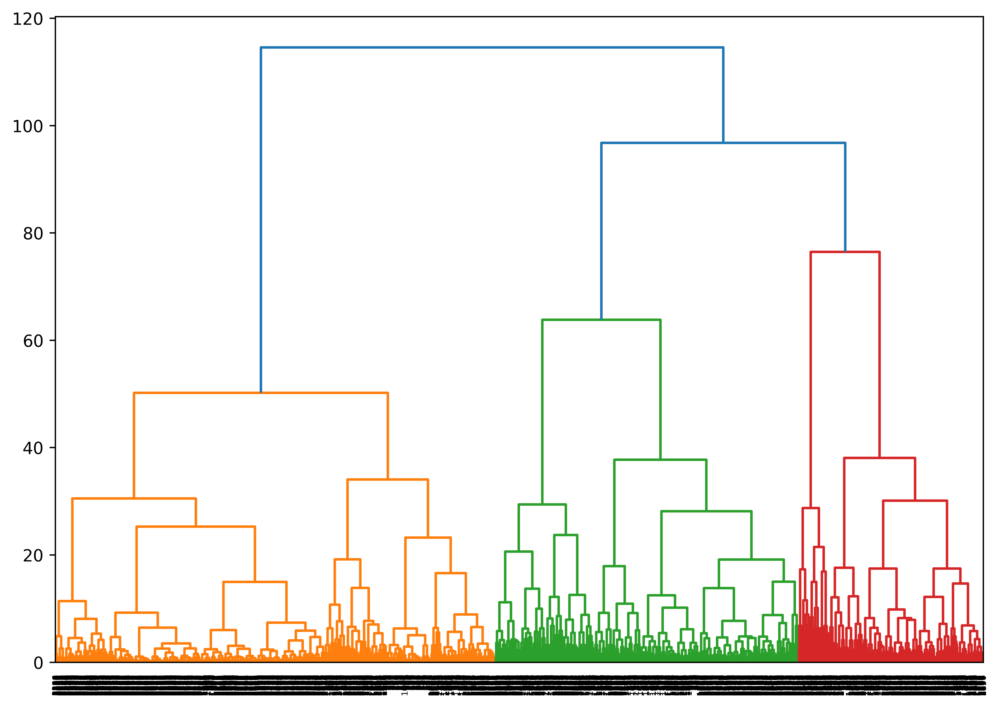

In [68]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

linked = linkage(data_scaled, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linked)
plt.show()

#DBSCAN

In [69]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(data_scaled)
distances, indices = neighbors_fit.kneighbors(data_scaled)

distances = np.sort(distances[:, 1], axis=0)
plt.plot(distances)
plt.show()
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters as needed
dbscan_labels = dbscan.fit_predict(data_scaled)


## Cluster Analysis and Interpretation:

In [70]:
# Example to interpret clusters
data['KMeans_Labels'] = kmeans_labels
data['DBSCAN_Labels'] = dbscan_labels

cluster_summary = data.groupby('KMeans_Labels').mean()
print(cluster_summary)


                    Balance  Qual_miles  cc1_miles  cc2_miles  cc3_miles  \
KMeans_Labels                                                              
0              90878.373494  136.419009   2.046854        1.0        1.0   
1              33477.055778   21.601801   1.162081        1.0        1.0   
2              94115.314408   30.408397   3.623092        1.0        1.0   

                Bonus_miles  Bonus_trans  Flight_miles_12mo  Flight_trans_12  \
KMeans_Labels                                                                  
0              19208.049531    15.544846         689.064257         2.220214   
1               3638.285643     6.077539          29.190095         0.115058   
2              33755.916985    17.394084          60.203244         0.218034   

               Days_since_enroll  DBSCAN_Labels  
KMeans_Labels                                    
0                    4366.151272       0.286479  
1                    3622.759380       0.975488  
2                 

## Visualization of Clusters

In [71]:
#plt.scatter(data_scaled[:, 0], data_scaled[:, 1], c=kmeans_labels, cmap='rainbow')
#plt.title('K-Means Clustering')
#plt.xlabel('Balance')
#plt.ylabel(' Qual_miles')
#plt.show()


In [ ]:
Copy code
data_scaled = data_scaled.to_numpy()  # Convert DataFrame to NumPy array
plt.scatter(data_scaled[:, 0], data_scaled[:, 1], c=kmeans_labels, cmap='rainbow')
Verifying the Data Type:


In [74]:
data_scaled = data_scaled.to_numpy()
plt.scatter(data_scaled[:,0], data_scaled[:,1], c = kmeans_labels, cmap='rainbow')

##  Evaluation and Performance Metrics

In [73]:
# Silhouette Score for K-Means
silhouette_kmeans = silhouette_score(data_scaled, kmeans_labels)
print('Silhouette Score for K-Means:', silhouette_kmeans)

# Silhouette Score for DBSCAN
silhouette_dbscan = silhouette_score(data_scaled, dbscan_labels)
print('Silhouette Score for DBSCAN:', silhouette_dbscan)


Silhouette Score for K-Means: 0.32443317777090286
Silhouette Score for DBSCAN: -0.17378136981398895


## Conclusion


In [ ]:
By following these steps, you will successfully implement and evaluate K-Means, Hierarchical, and 
DBSCAN clustering algorithms on a real-world dataset. Each step allows you to gain insights into how these algorithms work, 
their strengths, and weaknesses, and how to interpret their results.
Make sure to document your findings and insights along the way to provide a comprehensive analysis.